Instalación de librerías:

In [ ]:
pip install pandas numpy matplotlib seaborn scikit-learn lime shap

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from scipy.stats import ttest_ind
import lime
import lime.lime_tabular
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report
import shap

Cargar dataset:

In [3]:
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/pima-indians-diabetes.data.csv"
columns = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin",
           "BMI", "DiabetesPedigreeFunction", "Age", "Outcome"]
df = pd.read_csv(url, names=columns)

df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# About Dataset
## Context

This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

## Content

The datasets consists of several medical predictor variables and one target variable, Outcome. Predictor variables includes the number of pregnancies the patient has had, their BMI, insulin level, age, and so on.

## Acknowledgements

Smith, J.W., Everhart, J.E., Dickson, W.C., Knowler, W.C., & Johannes, R.S. (1988). Using the ADAP learning algorithm to forecast the onset of diabetes mellitus. In Proceedings of the Symposium on Computer Applications and Medical Care (pp. 261--265). IEEE Computer Society Press.

## Inspiration

Can you build a machine learning model to accurately predict whether or not the patients in the dataset have diabetes or not?

Source: Kaggle

# Acerca del Conjunto de Datos

## Contexto

Este conjunto de datos proviene originalmente del Instituto Nacional de Diabetes y Enfermedades Digestivas y Renales. El objetivo del conjunto de datos es predecir, de manera diagnóstica, si un paciente tiene o no diabetes, basándose en ciertas mediciones diagnósticas incluidas en el conjunto. Se aplicaron varias restricciones para la selección de estas instancias a partir de una base de datos más grande. En particular, todos los pacientes aquí son mujeres de al menos 21 años de edad y de ascendencia indígena pima.

## Contenido

El conjunto de datos consta de varias variables predictoras médicas y una variable objetivo llamada Outcome (Resultado). Las variables predictoras incluyen el número de embarazos que ha tenido la paciente, su índice de masa corporal (IMC), nivel de insulina, edad, entre otras.

## Agradecimientos

Smith, J.W., Everhart, J.E., Dickson, W.C., Knowler, W.C., & Johannes, R.S. (1988). Uso del algoritmo de aprendizaje ADAP para predecir la aparición de la diabetes mellitus. En las Actas del Simposio sobre Aplicaciones Informáticas y Cuidado Médico (pp. 261–265). IEEE Computer Society Press.

## Inspiración

¿Puedes construir un modelo de aprendizaje automático que prediga con precisión si los pacientes del conjunto de datos tienen o no diabetes?

Fuente: Kaggle

## EDA

       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  120.894531      69.105469      20.536458   79.799479   
std       3.369578   31.972618      19.355807      15.952218  115.244002   
min       0.000000    0.000000       0.000000       0.000000    0.000000   
25%       1.000000   99.000000      62.000000       0.000000    0.000000   
50%       3.000000  117.000000      72.000000      23.000000   30.500000   
75%       6.000000  140.250000      80.000000      32.000000  127.250000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    31.992578                  0.471876   33.240885    0.348958  
std      7.884160                  0.331329   11.760232    0.476951  
min      0.000000                  

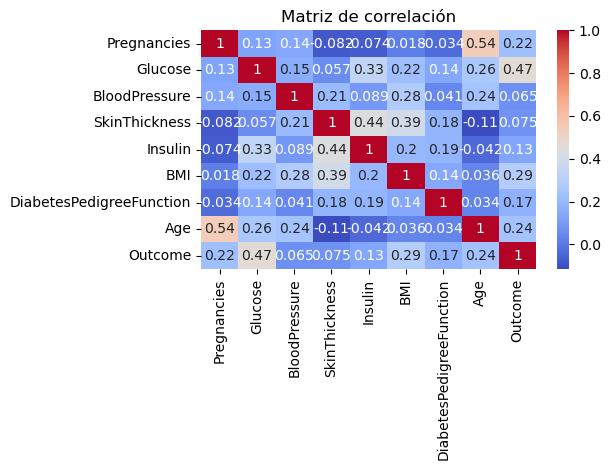

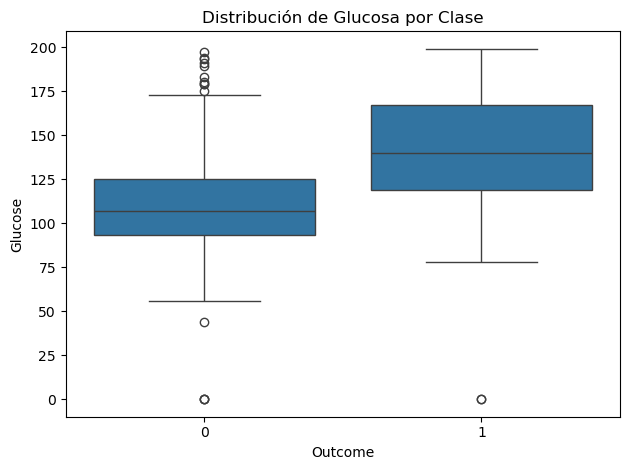

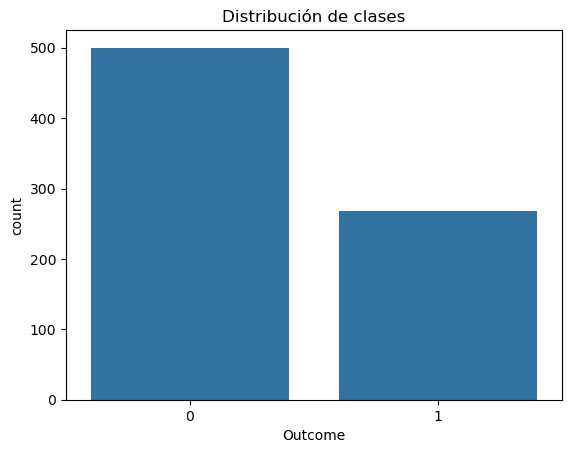

<function matplotlib.pyplot.show(close=None, block=None)>

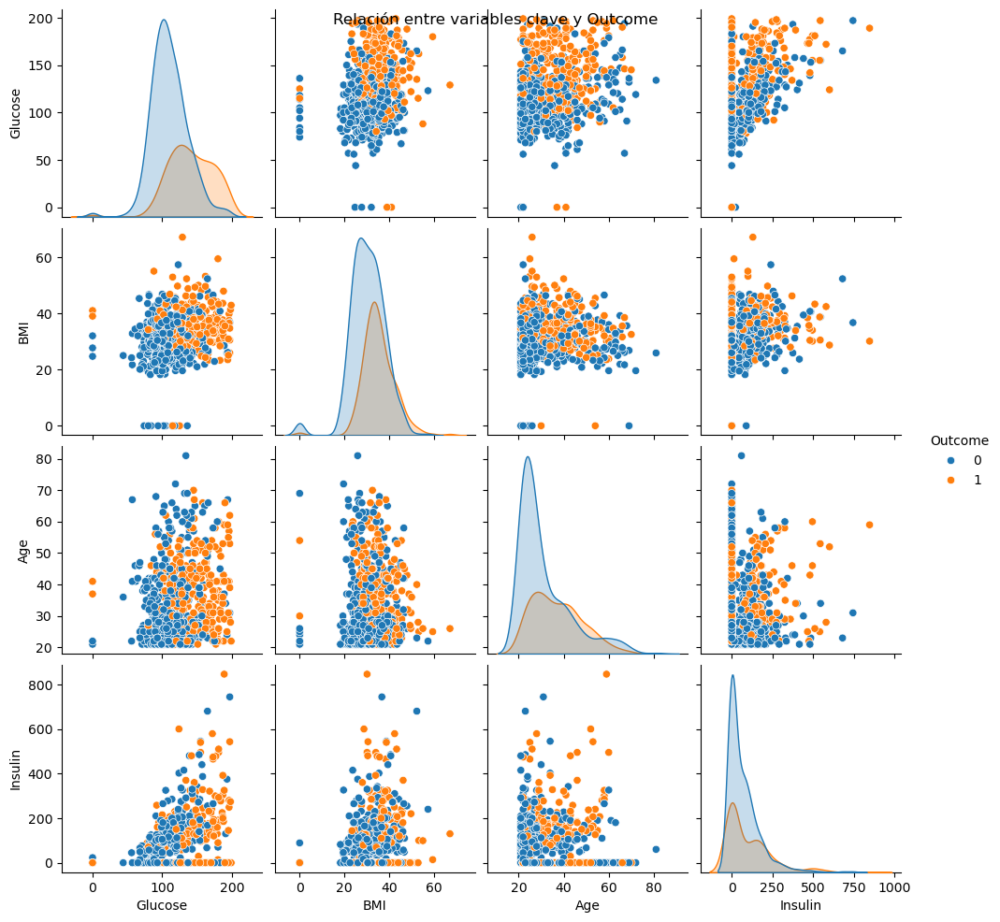

In [4]:
# Descripcion básica
print(df.describe())

# Matriz de correlación
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title("Matriz de correlación")
plt.tight_layout()
plt.savefig("matriz_correlacion.png", dpi=300)  
plt.show()

# Boxplot
sns.boxplot(x='Outcome', y='Glucose', data=df)
plt.title("Distribución de Glucosa por Clase")
plt.tight_layout()
plt.savefig("boxplot_glucosa.png", dpi=300) 
plt.show()

# Muestra del desbalance:
sns.countplot(x="Outcome", data=df)
plt.title("Distribución de clases")
plt.savefig("Desbalance.png", dpi=300) 
plt.show()

# Visualización específica de algunas variables que serán clave:
sns.pairplot(df, hue="Outcome", vars=["Glucose", "BMI", "Age", "Insulin"])
plt.suptitle("Relación entre variables clave y Outcome")
plt.savefig("VariablesClaves.png", dpi=300) 
plt.show


## Preparación de los datos:

In [5]:
X = df.drop("Outcome", axis=1)
y = df["Outcome"]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

## Estadística clásica:

### T-test para la glucosa

para ver si hay diferencia significativa en las medias entre clases

In [6]:
diabetic = df[df['Outcome'] == 1]['Glucose']
non_diabetic = df[df['Outcome'] == 0]['Glucose']
t_stat, p_val = ttest_ind(diabetic, non_diabetic)
print(f"T-test Glucosa: estadístico = {t_stat}, p-valor = {p_val}")

T-test Glucosa: estadístico = 14.600060005973894, p-valor = 8.935431645289912e-43


Hay diferencias significativas.

### Regresión logística

In [7]:
log_model = LogisticRegression()
log_model.fit(X_train, y_train)
y_pred_log = log_model.predict(X_test)
print("                    --- Logistic Regression ---")
print(classification_report(y_test, y_pred_log))

                    --- Logistic Regression ---
              precision    recall  f1-score   support

           0       0.81      0.80      0.81        99
           1       0.65      0.67      0.66        55

    accuracy                           0.75       154
   macro avg       0.73      0.74      0.73       154
weighted avg       0.76      0.75      0.75       154



In [8]:
i = 5
instance = X_test[i]

logreg_probs = log_model.predict_proba([instance])[0]
logreg_class = log_model.predict([instance])[0]

print(f"Regresión Logística → Clase predicha: {logreg_class}, Probabilidades: {logreg_probs}")

Regresión Logística → Clase predicha: 0, Probabilidades: [0.56027447 0.43972553]


Por lo tanto, se clasifica la instancia 5 como no diabetica.

## Random Forest:

In [9]:
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print("                      --- Random Forest ---")
print(classification_report(y_test, y_pred_rf))

                      --- Random Forest ---
              precision    recall  f1-score   support

           0       0.79      0.79      0.79        99
           1       0.62      0.62      0.62        55

    accuracy                           0.73       154
   macro avg       0.70      0.70      0.70       154
weighted avg       0.73      0.73      0.73       154



In [10]:
i = 5
instance = X_test[i]

rf_probs = rf_model.predict_proba([instance])[0]
rf_class = rf_model.predict([instance])[0]

print(f"Random Forest → Clase predicha: {rf_class}, Probabilidades: {rf_probs}")

Random Forest → Clase predicha: 1, Probabilidades: [0.47 0.53]


En este caso, se le asigna la clase diabetica.

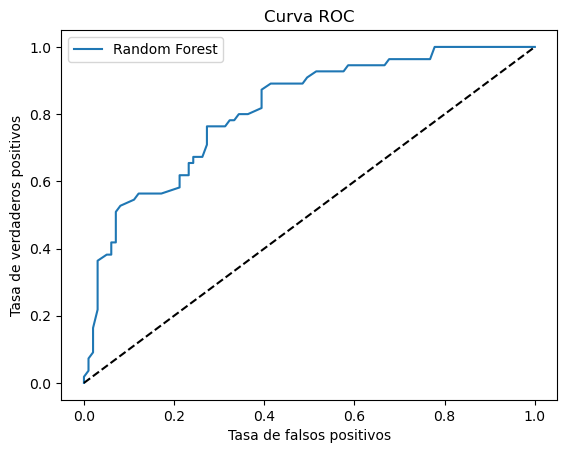

In [11]:
fpr, tpr, _ = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1])
plt.plot(fpr, tpr, label='Random Forest')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('Tasa de falsos positivos')
plt.ylabel('Tasa de verdaderos positivos')
plt.title('Curva ROC')
plt.legend()
plt.show()

## Redes neuronales

In [12]:
nn_model = MLPClassifier(random_state=42)
nn_model.fit(X_train, y_train)
y_pred_nn = nn_model.predict(X_test)

/Applications/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [13]:
print("                      --- Redes Neuronales ---")
print(classification_report(y_test, y_pred_nn))

                      --- Redes Neuronales ---
              precision    recall  f1-score   support

           0       0.81      0.82      0.81        99
           1       0.67      0.65      0.66        55

    accuracy                           0.76       154
   macro avg       0.74      0.74      0.74       154
weighted avg       0.76      0.76      0.76       154



In [14]:
i = 5
instance = X_test[i]

nn_probs = nn_model.predict_proba([instance])[0]
nn_class = nn_model.predict([instance])[0]

print(f"Redes Neuronales → Clase predicha: {nn_class}, Probabilidades: {nn_probs}")

Redes Neuronales → Clase predicha: 1, Probabilidades: [0.35693737 0.64306263]


Para este modelo se predecide la clase diabética.

## LIME para interpretación de modelo RF

In [15]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

### Ejemplo de interpretación de una instancia

In [16]:
i = 5
exp = explainer.explain_instance(X_test[i], rf_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example.html')

## Visualización de LIME barplot

/var/folders/l6/_cfd35_560d06yw7ytsnnx0r0000gn/T/ipykernel_2159/3234385800.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(lime_values.values()), y=list(lime_values.keys()), palette="viridis")


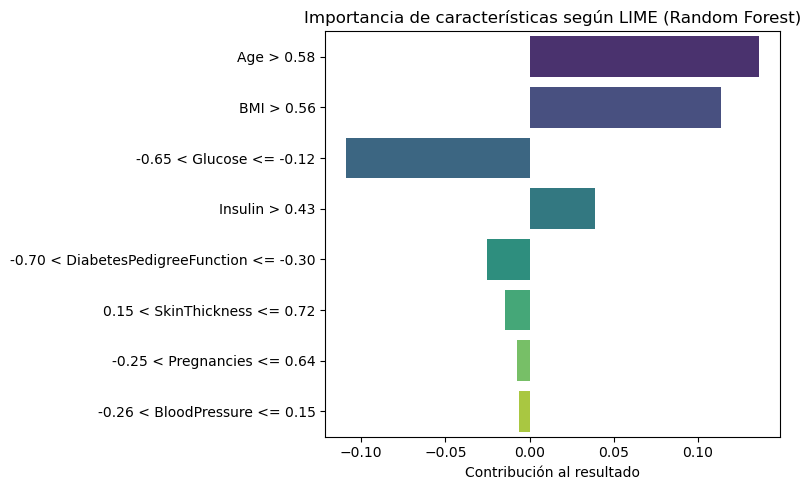

In [17]:
lime_values = dict(exp.as_list())
plt.figure(figsize=(8, 5))
sns.barplot(x=list(lime_values.values()), y=list(lime_values.keys()), palette="viridis")
plt.title("Importancia de características según LIME (Random Forest)")
plt.xlabel("Contribución al resultado")
plt.tight_layout()
plt.show()

## Visualización de coeficientes de regresión logística

/var/folders/l6/_cfd35_560d06yw7ytsnnx0r0000gn/T/ipykernel_2159/426179625.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=coefs.values, y=coefs.index, palette="magma")


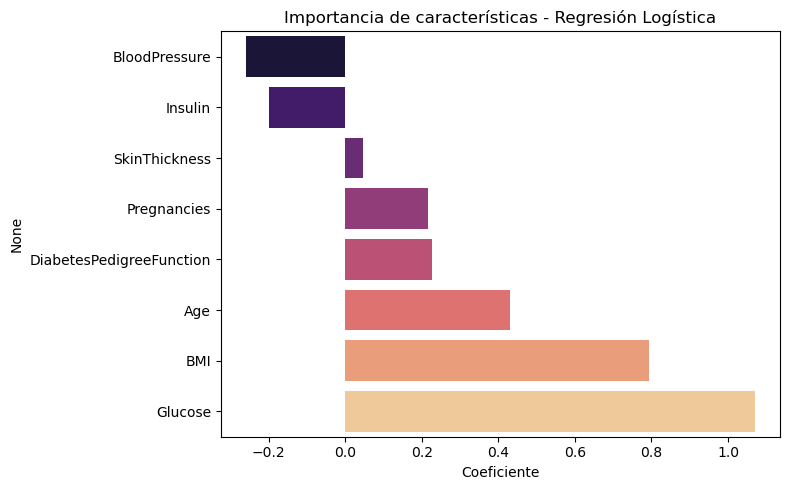

In [18]:
coefs = pd.Series(log_model.coef_[0], index=X.columns).sort_values()
plt.figure(figsize=(8, 5))
sns.barplot(x=coefs.values, y=coefs.index, palette="magma")
plt.title("Importancia de características - Regresión Logística")
plt.xlabel("Coeficiente")
plt.tight_layout()
plt.show()

## Comparación visual LIME vs Logística

/var/folders/l6/_cfd35_560d06yw7ytsnnx0r0000gn/T/ipykernel_2159/2012940993.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x=list(lime_values.values()), y=list(lime_values.keys()), palette="Blues_d")
/var/folders/l6/_cfd35_560d06yw7ytsnnx0r0000gn/T/ipykernel_2159/2012940993.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1], x=coefs.values, y=coefs.index, palette="Reds")


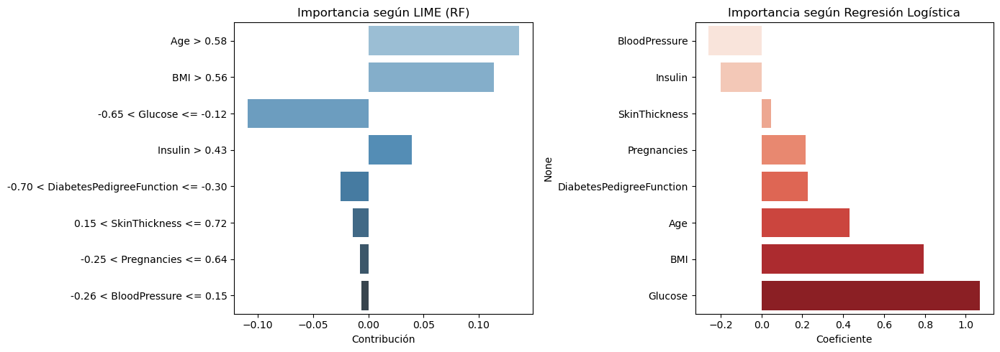

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.barplot(ax=axes[0], x=list(lime_values.values()), y=list(lime_values.keys()), palette="Blues_d")
axes[0].set_title("Importancia según LIME (RF)")
axes[0].set_xlabel("Contribución")
sns.barplot(ax=axes[1], x=coefs.values, y=coefs.index, palette="Reds")
axes[1].set_title("Importancia según Regresión Logística")
axes[1].set_xlabel("Coeficiente")
plt.tight_layout()
plt.show()

## LIME para interpretación de modelo Redes Neuronales

In [20]:
explainer_nn = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

In [21]:
i = 5
exp = explainer_nn.explain_instance(X_test[i], nn_model.predict_proba, num_features=8)

exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example_nn.html')

## Visualización LIME barplot

/var/folders/l6/_cfd35_560d06yw7ytsnnx0r0000gn/T/ipykernel_2159/927575888.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(lime_values.values()), y=list(lime_values.keys()), palette="viridis")


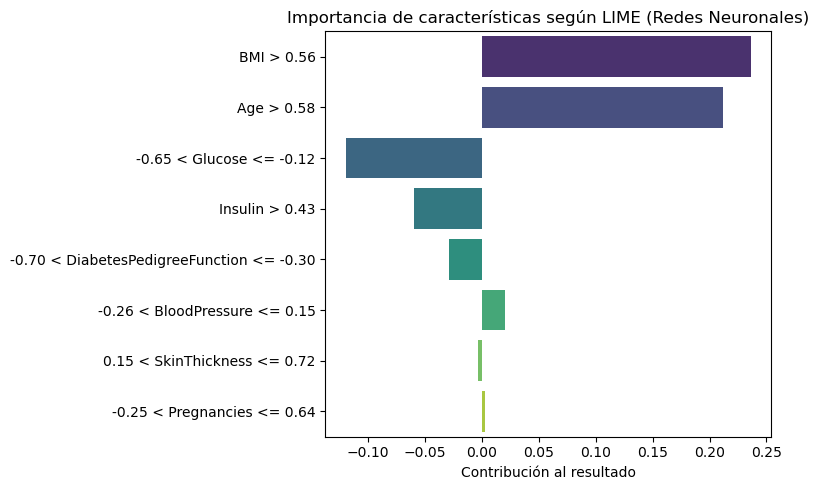

In [22]:
lime_values = dict(exp.as_list())
plt.figure(figsize=(8, 5))
sns.barplot(x=list(lime_values.values()), y=list(lime_values.keys()), palette="viridis")
plt.title("Importancia de características según LIME (Redes Neuronales)")
plt.xlabel("Contribución al resultado")
plt.tight_layout()
plt.show()

## SHAP Random Forest

In [44]:
X_orig = df.drop("Outcome", axis=1)
y_orig = df["Outcome"]

X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X_orig, y_orig, test_size=0.2, random_state=42)

In [45]:
rf_model_orig = RandomForestClassifier(random_state=42)
rf_model_orig.fit(X_train_orig, y_train_orig)

RandomForestClassifier(random_state=42)

In [48]:
explainer = shap.TreeExplainer(rf_model_orig)
shap_values = explainer.shap_values(X_test) 

Random Forest → Clase predicha: 1, Probabilidades: [0.47 0.53]


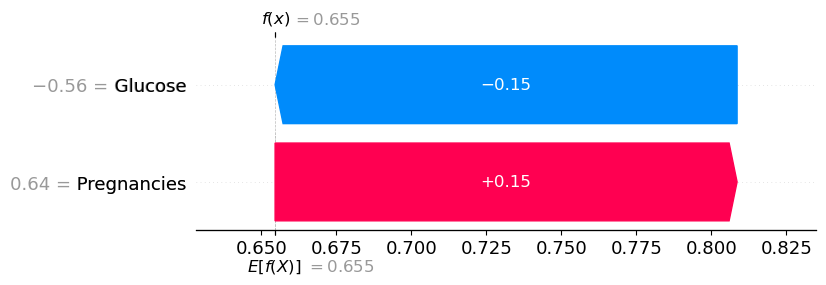

In [49]:
feature_names = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin",
           "BMI", "DiabetesPedigreeFunction", "Age"] # Reemplaza con los nombres reales
,
X_test_df = pd.DataFrame(X_test, columns=feature_names)

shap_explanation = shap.Explanation(
    shap_values[0][5], 
    base_values=explainer.expected_value[0], 
    data=X_test_df.iloc[5],  
    feature_names=X_test_df.columns  
)
print(f"Random Forest → Clase predicha: {rf_class}, Probabilidades: {rf_probs}")
# Generar el gráfico de cascada
fig = shap.plots.waterfall(shap_explanation)

## Datos perturbados

In [50]:
def add_noise(X, noise_level=0.1):
    np.random.seed(42)
    noise = np.random.normal(0, noise_level, X.shape)
    return X + noise

def drop_features(X, drop_indices=[1, 3]):
    return np.delete(X, drop_indices, axis=1)

def scale_feature(X, col_idx, factor):
    X_copy = X.copy()
    X_copy[:, col_idx] *= factor
    return X_copy

In [51]:
# Ejemplo de perturbación
X_perturbed_noise = add_noise(X_test, noise_level=0.2)
X_perturbed_dropped = drop_features(X_test, drop_indices=[1, 3])
X_perturbed_scaled = scale_feature(X_test, col_idx=0, factor=1.5)

In [52]:
# Modelo logístico
log_model = LogisticRegression()
log_model.fit(X_train, y_train) 
print("\n--- Evaluación con datos ruidosos Modelo logístico ---")
y_pred_noise_log = log_model.predict(X_perturbed_noise)
print("                    --- Logistic Regression ---")
print(classification_report(y_test, y_pred_noise_log))


--- Evaluación con datos ruidosos Modelo logístico ---
                    --- Logistic Regression ---
              precision    recall  f1-score   support

           0       0.80      0.77      0.78        99
           1       0.61      0.65      0.63        55

    accuracy                           0.73       154
   macro avg       0.71      0.71      0.71       154
weighted avg       0.73      0.73      0.73       154



In [56]:
i = 5
instance_perturbed = X_perturbed_noise[i]

# Predecimos probabilidades y clase con el modelo previamente entrenado
logreg_probs_perturbed = log_model.predict_proba([instance_perturbed])[0]
logreg_class_perturbed = log_model.predict([instance_perturbed])[0]

print(f"Regresión Logística (perturbado) → Clase predicha: {logreg_class_perturbed}, Probabilidades: {logreg_probs_perturbed}")

Regresión Logística (perturbado) → Clase predicha: 0, Probabilidades: [0.53884977 0.46115023]


In [53]:
print("\nComparativa de la misma instancia (original vs. perturbada):")

# Original
original_instance = X_test[i]
logreg_probs_original = log_model.predict_proba([original_instance])[0]
logreg_class_original = log_model.predict([original_instance])[0]

print(f"[Original] → Clase: {logreg_class_original}, Probabilidades: {logreg_probs_original}")

# Perturbada
perturbed_instance = X_perturbed_noise[i]
logreg_probs_perturbed = log_model.predict_proba([perturbed_instance])[0]
logreg_class_perturbed = log_model.predict([perturbed_instance])[0]

print(f"[Perturbada] → Clase: {logreg_class_perturbed}, Probabilidades: {logreg_probs_perturbed}")



Comparativa de la misma instancia (original vs. perturbada):
[Original] → Clase: 0, Probabilidades: [0.56027447 0.43972553]
[Perturbada] → Clase: 0, Probabilidades: [0.53884977 0.46115023]


In [54]:
# Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
print("\n--- Evaluación con datos ruidosos Random Forest ---")
y_pred_noise_rf = rf_model.predict(X_perturbed_noise)
print("                    --- Random Forest ---")
print(classification_report(y_test, y_pred_noise_rf))


--- Evaluación con datos ruidosos Random Forest ---
                    --- Random Forest ---
              precision    recall  f1-score   support

           0       0.79      0.77      0.78        99
           1       0.60      0.64      0.62        55

    accuracy                           0.72       154
   macro avg       0.70      0.70      0.70       154
weighted avg       0.72      0.72      0.72       154



In [57]:
i = 5

# Predecimos probabilidades y clase con el modelo previamente entrenado
rf_probs_perturbed = rf_model.predict_proba([instance_perturbed])[0]
rf_class_perturbed = rf_model.predict([instance_perturbed])[0]

print(f"Random Forest (perturbado) → Clase predicha: {rf_class_perturbed}, Probabilidades: {rf_probs_perturbed}")

Random Forest (perturbado) → Clase predicha: 0, Probabilidades: [0.51 0.49]


In [58]:
print("\nComparativa de la misma instancia (original vs. perturbada):")

# Original
original_instance = X_test[i]
rf_probs_original = rf_model.predict_proba([original_instance])[0]
rf_class_original = rf_model.predict([original_instance])[0]

print(f"[Original] → Clase: {rf_class_original}, Probabilidades: {rf_probs_original}")

# Perturbada
perturbed_instance = X_perturbed_noise[i]
rf_probs_perturbed = rf_model.predict_proba([perturbed_instance])[0]
rf_class_perturbed = rf_model.predict([perturbed_instance])[0]

print(f"[Perturbada] → Clase: {rf_class_perturbed}, Probabilidades: {rf_probs_perturbed}")


Comparativa de la misma instancia (original vs. perturbada):
[Original] → Clase: 1, Probabilidades: [0.47 0.53]
[Perturbada] → Clase: 0, Probabilidades: [0.51 0.49]


In [59]:
# Redes Neuronales:

nn_model = MLPClassifier(random_state=42)
nn_model.fit(X_train, y_train)
print("\n--- Evaluación con datos ruidosos Redes Neuronales ---")
y_pred_noise_rn = nn_model.predict(X_perturbed_noise)
print("                    --- Redes Neuronales ---")
print(classification_report(y_test, y_pred_noise_rn))


--- Evaluación con datos ruidosos Redes Neuronales ---
                    --- Redes Neuronales ---
              precision    recall  f1-score   support

           0       0.77      0.76      0.77        99
           1       0.58      0.60      0.59        55

    accuracy                           0.70       154
   macro avg       0.68      0.68      0.68       154
weighted avg       0.70      0.70      0.70       154



/Applications/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [60]:
i = 5

# Predecimos probabilidades y clase con el modelo previamente entrenado
rn_probs_perturbed = nn_model.predict_proba([instance_perturbed])[0]
rn_class_perturbed = nn_model.predict([instance_perturbed])[0]

print(f"Redes Neuronales (perturbado) → Clase predicha: {rn_class_perturbed}, Probabilidades: {rn_probs_perturbed}")

Redes Neuronales (perturbado) → Clase predicha: 1, Probabilidades: [0.42073263 0.57926737]


In [61]:
print("\nComparativa de la misma instancia (original vs. perturbada):")

# Original
original_instance = X_test[i]
rn_probs_original = nn_model.predict_proba([original_instance])[0]
rn_class_original = nn_model.predict([original_instance])[0]

print(f"[Original] → Clase: {rn_class_original}, Probabilidades: {rn_probs_original}")

# Perturbada
perturbed_instance = X_perturbed_noise[i]
rn_probs_perturbed = nn_model.predict_proba([perturbed_instance])[0]
rn_class_perturbed = nn_model.predict([perturbed_instance])[0]

print(f"[Perturbada] → Clase: {rn_class_perturbed}, Probabilidades: {rn_probs_perturbed}")


Comparativa de la misma instancia (original vs. perturbada):
[Original] → Clase: 1, Probabilidades: [0.35693737 0.64306263]
[Perturbada] → Clase: 1, Probabilidades: [0.42073263 0.57926737]


# Lime para datos perturbados

In [62]:
# Random Forest
explainer_p = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)
i = 5
exp = explainer_p.explain_instance(X_perturbed_noise[i], rf_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example_perturbados.html')

In [63]:
# Redes Neuronales
explainer_nn_p = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)
i = 5
exp = explainer_nn_p.explain_instance(X_perturbed_noise[i], nn_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example_nn_perturbados.html')

# Shap para datos perturbados

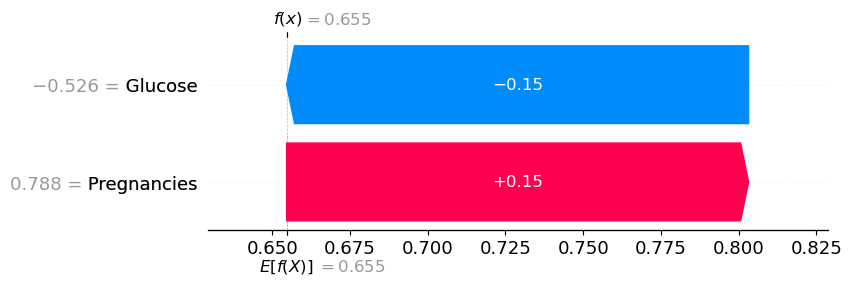

In [64]:
# Random Forest
explainer_sh = shap.TreeExplainer(rf_model_orig)

# Obtén valores SHAP para los datos perturbados
shap_values_noise = explainer_sh.shap_values(X_perturbed_noise)

feature_names = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin",
                 "BMI", "DiabetesPedigreeFunction", "Age"]

X_perturbed_df = pd.DataFrame(X_perturbed_noise, columns=feature_names)

# Elige una instancia para explicar (ej. la 5ª)
instance_idx = 5

# Construye la explicación SHAP
shap_explanation_noise = shap.Explanation(
    shap_values_noise[0][instance_idx], 
    base_values=explainer_sh.expected_value[0], 
    data=X_perturbed_df.iloc[instance_idx],  
    feature_names=X_perturbed_df.columns  
)

# gráfico de cascada para la instancia perturbada
fig = shap.plots.waterfall(shap_explanation_noise)

# Variables Escaladas:

In [ ]:
# Modelo logístico
log_model = LogisticRegression()
log_model.fit(X_train, y_train) 
print("\n--- Evaluación con datos ruidosos Modelo logístico ---")
y_pred_scaled_log = log_model.predict(X_perturbed_scaled)
print("                    --- Logistic Regression ---")
print(classification_report(y_test, y_pred_scaled_log))


--- Evaluación con datos ruidosos Modelo logístico ---
                    --- Logistic Regression ---
              precision    recall  f1-score   support

           0       0.81      0.80      0.81        99
           1       0.65      0.67      0.66        55

    accuracy                           0.75       154
   macro avg       0.73      0.74      0.73       154
weighted avg       0.76      0.75      0.75       154



In [ ]:
i = 5
instance_perturbed = X_perturbed_scaled[i]

# Predecimos probabilidades y clase con el modelo previamente entrenado
logreg_probs_perturbed = log_model.predict_proba([instance_perturbed])[0]
logreg_class_perturbed = log_model.predict([instance_perturbed])[0]

print(f"Regresión Logística (perturbado) → Clase predicha: {logreg_class_perturbed}, Probabilidades: {logreg_probs_perturbed}")

Regresión Logística (perturbado) → Clase predicha: 0, Probabilidades: [0.54316338 0.45683662]


In [ ]:
# Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
print("\n--- Evaluación con datos ruidosos Random Forest ---")
y_pred_scaled_rf = rf_model.predict(X_perturbed_scaled)
print("                    --- Random Forest ---")
print(classification_report(y_test, y_pred_scaled_rf))


--- Evaluación con datos ruidosos Random Forest ---
                    --- Random Forest ---
              precision    recall  f1-score   support

           0       0.78      0.78      0.78        99
           1       0.60      0.60      0.60        55

    accuracy                           0.71       154
   macro avg       0.69      0.69      0.69       154
weighted avg       0.71      0.71      0.71       154



In [ ]:
i = 5

# Predecimos probabilidades y clase con el modelo previamente entrenado
rf_probs_perturbed = rf_model.predict_proba([instance_perturbed])[0]
rf_class_perturbed = rf_model.predict([instance_perturbed])[0]

print(f"Random Forest (perturbado) → Clase predicha: {rf_class_perturbed}, Probabilidades: {rf_probs_perturbed}")

Random Forest (perturbado) → Clase predicha: 1, Probabilidades: [0.44 0.56]


In [ ]:
# Redes Neuronales
nn_model = MLPClassifier(random_state=42)
nn_model.fit(X_train, y_train)
print("\n--- Evaluación con datos ruidosos Redes Neuronales ---")
y_pred_scaled_rn = nn_model.predict(X_perturbed_scaled)
print("                    --- Redes Neuronales ---")
print(classification_report(y_test, y_pred_scaled_rn))


--- Evaluación con datos ruidosos Redes Neuronales ---
                    --- Redes Neuronales ---
              precision    recall  f1-score   support

           0       0.82      0.81      0.81        99
           1       0.66      0.67      0.67        55

    accuracy                           0.76       154
   macro avg       0.74      0.74      0.74       154
weighted avg       0.76      0.76      0.76       154



/Applications/anaconda3/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
i = 5

# Predecimos probabilidades y clase con el modelo previamente entrenado
rn_probs_perturbed = nn_model.predict_proba([instance_perturbed])[0]
rn_class_perturbed = nn_model.predict([instance_perturbed])[0]

print(f"Redes Neuronales (perturbado) → Clase predicha: {rn_class_perturbed}, Probabilidades: {rn_probs_perturbed}")

Redes Neuronales (perturbado) → Clase predicha: 1, Probabilidades: [0.36529466 0.63470534]


# Lime para datos escalados

In [ ]:
# Random Forest
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)
i = 5
exp = explainer.explain_instance(X_perturbed_scaled[i], rf_model.predict_proba, num_features=8)
exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example.html')

In [ ]:
# Redes Neuronales
explainer_nn = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=X.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)
i = 5
exp = explainer_nn.explain_instance(X_perturbed_scaled[i], nn_model.predict_proba, num_features=8)

exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example_nn.html')

# Shap para datos escalados

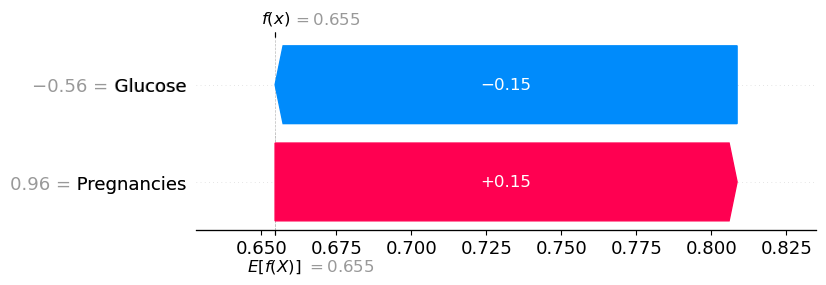

In [ ]:
# Random Forest
explainer_sh_esc = shap.TreeExplainer(rf_model_orig)

# Obtén valores SHAP para los datos perturbados
shap_values_noise = explainer_sh_esc.shap_values(X_perturbed_scaled)

feature_names = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin",
                 "BMI", "DiabetesPedigreeFunction", "Age"]

X_perturbed_df = pd.DataFrame(X_perturbed_scaled, columns=feature_names)

# Elige una instancia para explicar (ej. la 5ª)
instance_idx = 5

# Construye la explicación SHAP
shap_explanation_noise = shap.Explanation(
    shap_values_noise[0][instance_idx], 
    base_values=explainer_sh_esc.expected_value[0], 
    data=X_perturbed_df.iloc[instance_idx],  
    feature_names=X_perturbed_df.columns  
)

# gráfico de cascada para la instancia perturbada
fig = shap.plots.waterfall(shap_explanation_noise)

# Variables Eliminadas

In [66]:
drop_columns = [1, 3]
X_train_dropped = drop_features(X_train, drop_columns)
X_test_dropped = drop_features(X_test, drop_columns)

dropped_column_names = ["Pregnancies", "BloodPressure", "Insulin", "BMI", "DiabetesPedigreeFunction", "Age"]
X_train_dropped_df = pd.DataFrame(X_train_dropped, columns=dropped_column_names)


In [67]:
# Modelo logístico
log_model = LogisticRegression()
log_model.fit(X_train_dropped, y_train) 
print("\n--- Evaluación con datos ruidosos Modelo logístico ---")
y_pred_dropped_log = log_model.predict(X_perturbed_dropped)
print("                    --- Logistic Regression ---")
print(classification_report(y_test, y_pred_dropped_log))


--- Evaluación con datos ruidosos Modelo logístico ---
                    --- Logistic Regression ---
              precision    recall  f1-score   support

           0       0.69      0.77      0.73        99
           1       0.48      0.38      0.42        55

    accuracy                           0.63       154
   macro avg       0.58      0.57      0.58       154
weighted avg       0.61      0.63      0.62       154



In [68]:
i = 5
instance_perturbed = X_train_dropped[i]

# Predecimos probabilidades y clase con el modelo previamente entrenado
logreg_probs_dropped = log_model.predict_proba([instance_perturbed])[0]
logreg_class_dropped = log_model.predict([instance_perturbed])[0]

print(f"Regresión Logística (eliminadas) → Clase predicha: {logreg_class_dropped}, Probabilidades: {logreg_probs_dropped}")

Regresión Logística (eliminadas) → Clase predicha: 0, Probabilidades: [0.89810966 0.10189034]


In [69]:
# Random Forest

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_dropped, y_train)

print("\n--- Evaluación con datos ruidosos Random Forest ---")
y_pred_dropped_rf = rf_model.predict(X_perturbed_dropped)
print("                    --- Random Forest ---")
print(classification_report(y_test, y_pred_dropped_rf))


--- Evaluación con datos ruidosos Random Forest ---
                    --- Random Forest ---
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        99
           1       0.55      0.55      0.55        55

    accuracy                           0.68       154
   macro avg       0.65      0.65      0.65       154
weighted avg       0.68      0.68      0.68       154



In [70]:
i = 5
instance = X_test_dropped[i]

# Predecimos probabilidades y clase con el modelo previamente entrenado
rf_probs_dropped = rf_model.predict_proba([instance])[0]
rf_class_dropped = rf_model.predict([instance])[0]

print(f"Random Forest (eliminadas) → Clase predicha: {rf_class_dropped}, Probabilidades: {rf_probs_dropped}")

Random Forest (eliminadas) → Clase predicha: 1, Probabilidades: [0.21 0.79]


In [71]:
# Redes Neuronales
nn_model = MLPClassifier(random_state=42)
nn_model.fit(X_train_dropped, y_train)
print("\n--- Evaluación con datos ruidosos Redes Neuronales ---")
y_pred_dropped_rn = nn_model.predict(X_perturbed_dropped)
print("                    --- Redes Neuronales ---")
print(classification_report(y_test, y_pred_dropped_rn))


--- Evaluación con datos ruidosos Redes Neuronales ---
                    --- Redes Neuronales ---
              precision    recall  f1-score   support

           0       0.69      0.78      0.73        99
           1       0.49      0.38      0.43        55

    accuracy                           0.64       154
   macro avg       0.59      0.58      0.58       154
weighted avg       0.62      0.64      0.62       154



In [72]:
i = 5

# Predecimos probabilidades y clase con el modelo previamente entrenado
rn_probs_dropped = nn_model.predict_proba([instance])[0]
rn_class_dropped = nn_model.predict([instance])[0]

print(f"Redes Neuronales (perturbado) → Clase predicha: {rn_class_dropped}, Probabilidades:{rn_probs_dropped} ")

Redes Neuronales (perturbado) → Clase predicha: 1, Probabilidades:[0.22686144 0.77313856] 


# Lime para datos eliminados

In [73]:
# Random Forest

explainer_rf_d = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_dropped_df.values,
    feature_names=dropped_column_names,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)
i = 5
instance = X_test_dropped[i]
exp = explainer_rf_d.explain_instance(instance, rf_model.predict_proba, num_features=len(dropped_column_names))
exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example_eliminados.html')


In [74]:
# Redes Neuronales
explainer_rf_d = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_dropped_df.values,
    feature_names=dropped_column_names,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

i = 5
exp = explainer_rf_d.explain_instance(instance, nn_model.predict_proba, num_features=len(dropped_column_names))
exp.show_in_notebook(show_table=True)
exp.save_to_file('lime_explanation_example_nn_eliminados.html')

# Shap para datos eliminados

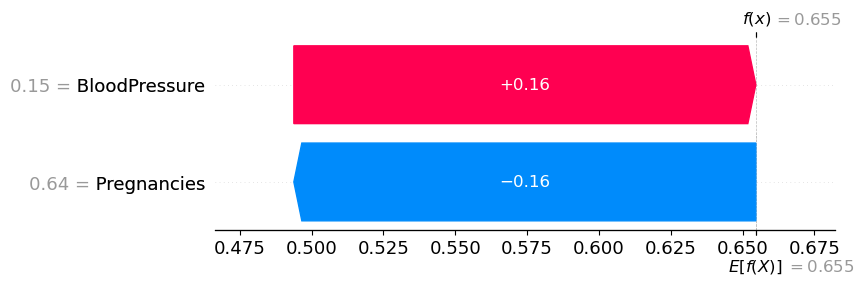

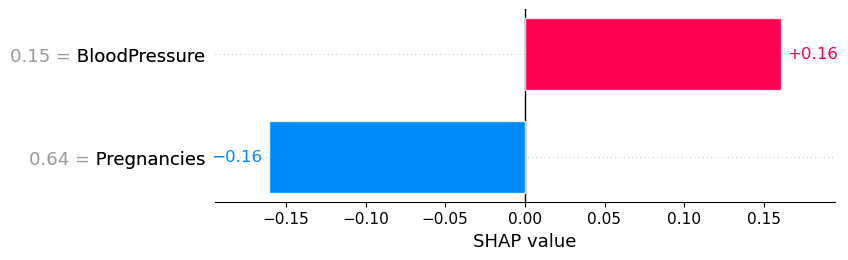

In [75]:
# Random Forest
explainer_sh_d = shap.TreeExplainer(rf_model)

# Obtén valores SHAP para los datos perturbados
shap_values_dropped = explainer_sh_d.shap_values(X_test_dropped)

dropped_column_names = ["Pregnancies", "BloodPressure", "Insulin", "BMI", "DiabetesPedigreeFunction", "Age"]

X_test_dropped_df = pd.DataFrame(X_test_dropped, columns=dropped_column_names)

instance_idx = 5

# Construye la explicación SHAP
shap_explanation_dropped = shap.Explanation(
    shap_values_dropped[0][instance_idx], 
    base_values=explainer_sh_d.expected_value[0], 
    data=X_test_dropped_df.iloc[instance_idx],  
    feature_names=X_test_dropped_df.columns
)

# Genera el gráfico de cascada
fig = shap.plots.waterfall(shap_explanation_dropped)
fig2 =shap.plots.bar(shap_explanation_dropped)